In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
# from matplotlib.colors import TwoSlopeNorm
# 創建自定義色圖
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import pandas as pd
import xarray as xr
import cmocean
import argopy
from argopy import ArgoIndex, DataFetcher as ArgoDataFetcher
from argopy import ArgoNVSReferenceTables
from argopy import ArgoColors  # This is a class with usefull pre-defined colors
from argopy.plot import scatter_map, scatter_plot   
argopy.set_options(cachedir='../tmp_cache')
#### The following code reproduce (not exaxcly) the content in this paper:
# https://www.sciencedirect.com/science/article/pii/S0304420323000440
# citation: Smyth, Adam J., and Robert T. Letscher. "Spatial and temporal occurrence of preformed nitrate anomalies in the subtropical North Pacific and North Atlantic oceans." Marine Chemistry 252 (2023): 104248. 


In [2]:
# 指定浮標編號列表https://www.mbari.org/wp-content/static/chemsensor/FloatListold.html
#float_ids = [5145, 6401, 6891, 8497, 8486] (corresponding: 8486Hawaii (5904124))
#6976Bermuda (5903377)
float_ids = [5901468, 1901379, 5903272, 5904094, 5904124, 1901378, 5903377, 5903594, 5903892]
# 初始化 Argo 數據提取器，指定數據集為 'bgc'
argopy.set_options(dataset='bgc', src='erddap', mode='expert')
argo_loader = ArgoDataFetcher(params='all')

# 提取指定浮標的數據
argo_data = argo_loader.float(float_ids).to_xarray()


/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self._dims = list(xarray_obj.dims.keys())
/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self._dims = list(xarray_obj.dims.keys())
/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more c

In [3]:
argo_data


<xarray.Dataset> Size: 339MB
Dimensions:                          (N_POINTS: 1019683)
Coordinates:
    LATITUDE                         (N_POINTS) float64 8MB 22.87 ... 48.19
    LONGITUDE                        (N_POINTS) float64 8MB -158.0 ... -40.12
    TIME                             (N_POINTS) datetime64[ns] 8MB 2007-12-23...
  * N_POINTS                         (N_POINTS) int64 8MB 0 1 ... 138540 138541
Data variables: (12/54)
    BBP700                           (N_POINTS) float32 4MB nan nan ... nan nan
    BBP700_ADJUSTED                  (N_POINTS) float32 4MB nan nan ... nan nan
    BBP700_ADJUSTED_ERROR            (N_POINTS) float32 4MB nan nan ... nan nan
    BBP700_ADJUSTED_QC               (N_POINTS) int64 8MB 99999 99999 ... 99999
    BBP700_DATA_MODE                 (N_POINTS) <U1 4MB 'A' 'A' 'A' ... '' '' ''
    BBP700_QC                        (N_POINTS) int64 8MB 99999 99999 ... 99999
    ...                               ...
    TEMP_ADJUSTED                    (N_POINTS) float32 4MB 24.47 ... 5.057
    TEMP_ADJUSTED_ERROR              (N_POINTS) float32 4MB 0.002 ... 0.002
    TEMP_ADJUSTED_QC                 (N_POINTS) int64 8MB 1 1 8 1 1 ... 1 1 4 1
    TEMP_DATA_MODE                   (N_POINTS) <U1 4MB 'D' 'D' 'D' ... '' '' ''
    TEMP_QC                          (N_POINTS) int64 8MB 1 1 8 1 1 ... 1 1 4 1
    TIME_QC                          (N_POINTS) int64 8MB 1 1 1 1 1 ... 1 1 1 1
Attributes:
    DATA_ID:              ARGO-BGC
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://erddap.ifremer.fr/erddap
    Fetched_by:           bioer
    Fetched_date:         2024/05/14
    Fetched_constraints:  WMO5901468
    Fetched_uri:          ['https://erddap.ifremer.fr/erddap/tabledap/ArgoFlo...

In [7]:
# 濾除需要的深度範圍 (100m 到 150m) 
filtered_data = argo_data.where((argo_data.PRES >= 25) & (argo_data.PRES <= 150), drop=True)

filtered_data

<xarray.Dataset> Size: 56MB
Dimensions:                          (N_POINTS: 153445)
Coordinates:
    LATITUDE                         (N_POINTS) float64 1MB 22.87 ... 48.19
    LONGITUDE                        (N_POINTS) float64 1MB -158.0 ... -40.12
    TIME                             (N_POINTS) datetime64[ns] 1MB 2007-12-23...
  * N_POINTS                         (N_POINTS) int64 1MB 15 16 ... 138091
Data variables: (12/54)
    BBP700                           (N_POINTS) float32 614kB nan nan ... nan
    BBP700_ADJUSTED                  (N_POINTS) float32 614kB nan nan ... nan
    BBP700_ADJUSTED_ERROR            (N_POINTS) float32 614kB nan nan ... nan
    BBP700_ADJUSTED_QC               (N_POINTS) float64 1MB 1e+05 ... 1e+05
    BBP700_DATA_MODE                 (N_POINTS) object 1MB 'A' 'A' 'A' ... '' ''
    BBP700_QC                        (N_POINTS) float64 1MB 1e+05 ... 1e+05
    ...                               ...
    TEMP_ADJUSTED                    (N_POINTS) float32 614kB 24.47 ... 14.54
    TEMP_ADJUSTED_ERROR              (N_POINTS) float32 614kB 0.002 ... 0.002
    TEMP_ADJUSTED_QC                 (N_POINTS) float64 1MB 1.0 8.0 ... 1.0 1.0
    TEMP_DATA_MODE                   (N_POINTS) object 1MB 'D' 'D' 'D' ... '' ''
    TEMP_QC                          (N_POINTS) float64 1MB 1.0 8.0 ... 1.0 1.0
    TIME_QC                          (N_POINTS) float64 1MB 1.0 1.0 ... 1.0 1.0
Attributes:
    DATA_ID:              ARGO-BGC
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://erddap.ifremer.fr/erddap
    Fetched_by:           bioer
    Fetched_date:         2024/05/14
    Fetched_constraints:  WMO5901468
    Fetched_uri:          ['https://erddap.ifremer.fr/erddap/tabledap/ArgoFlo...

In [2]:
# Convert the matlab for AOU calculation script by Peltzer (2007) 
# ref: https://www.mbari.org/technology/matlab-scripts/oceanographic-calculations/ 
def calculate_aou(salinity, temperature, oxygen):
    # 定義常數並計算氧氣飽和度
    T1 = (temperature + 273.15) / 100
    OSAT = -177.7888 + 255.5907 / T1 + 146.4813 * np.log(T1) - 22.2040 * T1
    OSAT += salinity * (-0.037362 + T1 * (0.016504 - 0.0020564 * T1))
    OSAT = np.exp(OSAT)

    # 從 ml/kg 轉換為 umol/kg
    OSAT = OSAT * 1000 / 22.392

    # 計算 AOU
    AOU = OSAT - oxygen
    return AOU


In [4]:
# 假設這裡有計算PreNO3的函數
def calculate_preno3(data, fPOM, fDOM, rPOM, rDOM):
    # 計算 AOU
    AOU = calculate_aou(data['PSAL'], data['TEMP'], data['DOXY_ADJUSTED'])

    # 計算 PreNO3
    PreNO3 = data['NITRATE_ADJUSTED'] - (fPOM * AOU / rPOM) - (fDOM * AOU / rDOM)
    return PreNO3

# 定義參數
fPOM = 0.5   # example value
fDOM = 0.5   # example value
rPOM = 10.6  # example value
rDOM = 18.1  # example value




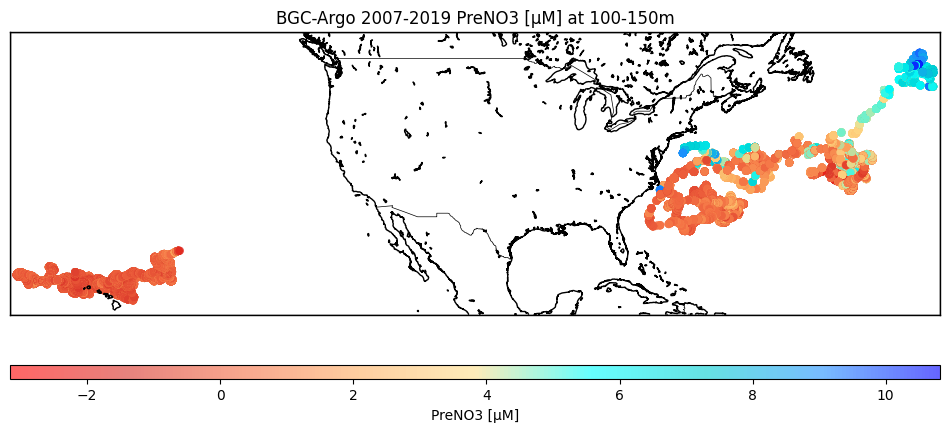

In [ ]:
# 計算 PreNO3
filtered_data['PreNO3'] = calculate_preno3(filtered_data, fPOM, fDOM, rPOM, rDOM)

# 獲取經緯度範圍
lon = filtered_data['LONGITUDE'].values
lat = filtered_data['LATITUDE'].values

# 去除 NaN 值
valid_mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(filtered_data['PreNO3'])
lon, lat, preno3 = lon[valid_mask], lat[valid_mask], filtered_data['PreNO3'].values[valid_mask]

# 計算經緯度範圍
lon_min, lon_max = lon.min(), lon.max()
lat_min, lat_max = lat.min(), lat.max()

colors = ["#ff0000", "#d73027", "#f46d43", "#fdae61", "#fee08b", "#00FFFF", "#00CED1", "#1E90FF", "#0000FF"]
cmap = LinearSegmentedColormap.from_list('PreNO3_cmap', colors, N=256)

# 繪製地圖
fig, ax = plt.subplots(figsize=(12, 6))
m = Basemap(projection='merc', llcrnrlat=lat_min-2.0, urcrnrlat=lat_max+2.0, llcrnrlon=lon_min-1.0, urcrnrlon=lon_max+1.0, resolution='i', ax=ax)

# 繪製海岸線和國界
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary()

# 將經緯度轉換為地圖上的坐標
x, y = m(lon, lat)

# 繪製 PreNO3 分佈
sc = m.scatter(x, y, c=preno3, cmap=cmap, marker='o', edgecolor='none', alpha=0.6)
cb = m.colorbar(sc, location='bottom', pad=0.5)
cb.set_label('PreNO3 [µM]')

# 設定標題
plt.title('BGC-Argo 2007-2019 PreNO3 [µM] at 100-150m')

plt.show()

In [5]:
Test_Nc = True
if Test_Nc:
    ds_tmp = xr.open_dataset("../tmp/argo_data.nc")
    prof_tmp = xr.open_dataset("../tmp/argo_profiles.nc")
    print(ds_tmp)
    print(prof_tmp)

<xarray.Dataset> Size: 112MB
Dimensions:                 (N_POINTS: 475170)
Coordinates:
    LATITUDE                (N_POINTS) float64 4MB ...
    LONGITUDE               (N_POINTS) float64 4MB ...
    TIME                    (N_POINTS) datetime64[ns] 4MB ...
  * N_POINTS                (N_POINTS) int64 4MB 0 1 2 ... 170248 170249 170250
Data variables: (12/36)
    CONFIG_MISSION_NUMBER   (N_POINTS) int64 4MB ...
    CYCLE_NUMBER            (N_POINTS) int64 4MB ...
    DIRECTION               (N_POINTS) <U1 2MB ...
    DOXY                    (N_POINTS) float32 2MB ...
    DOXY_ADJUSTED           (N_POINTS) float32 2MB ...
    DOXY_ADJUSTED_ERROR     (N_POINTS) float32 2MB ...
    ...                      ...
    TEMP_ADJUSTED           (N_POINTS) float32 2MB ...
    TEMP_ADJUSTED_ERROR     (N_POINTS) float32 2MB ...
    TEMP_ADJUSTED_QC        (N_POINTS) int64 4MB ...
    TEMP_DATA_MODE          (N_POINTS) <U1 2MB ...
    TEMP_QC                 (N_POINTS) int64 4MB ...
    TIME_QC  

In [6]:
if Test_Nc:
    nc_data = ds_tmp.where((ds_tmp.PRES >= 25) & (ds_tmp.PRES <= 150), drop=True)
    print(nc_data)

<xarray.Dataset> Size: 19MB
Dimensions:                 (N_POINTS: 71707)
Coordinates:
    LATITUDE                (N_POINTS) float64 574kB 31.76 31.76 ... 23.39 23.39
    LONGITUDE               (N_POINTS) float64 574kB -64.17 -64.17 ... -68.57
    TIME                    (N_POINTS) datetime64[ns] 574kB 2010-11-12T15:55:...
  * N_POINTS                (N_POINTS) int64 574kB 15 16 17 ... 169798 169799
Data variables: (12/36)
    CONFIG_MISSION_NUMBER   (N_POINTS) float64 574kB 1.0 1.0 1.0 ... 311.0 311.0
    CYCLE_NUMBER            (N_POINTS) float64 574kB 1.0 1.0 1.0 ... 311.0 311.0
    DIRECTION               (N_POINTS) object 574kB 'A' 'A' 'A' ... 'A' 'A' 'A'
    DOXY                    (N_POINTS) float32 287kB nan 185.7 nan ... nan nan
    DOXY_ADJUSTED           (N_POINTS) float32 287kB nan 206.1 nan ... nan nan
    DOXY_ADJUSTED_ERROR     (N_POINTS) float32 287kB nan 5.05 nan ... nan nan
    ...                      ...
    TEMP_ADJUSTED           (N_POINTS) float32 287kB 24.0 24

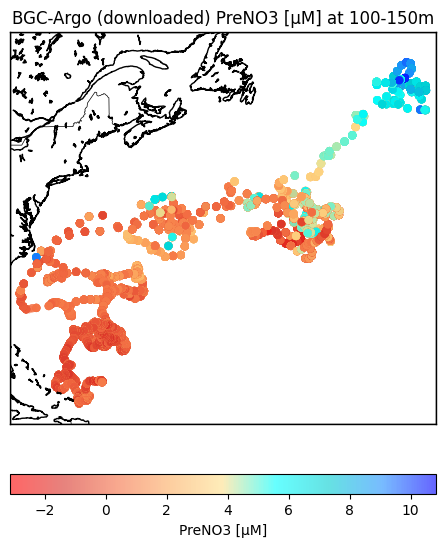

In [7]:
# 計算 PreNO3
nc_data['PreNO3'] = calculate_preno3(nc_data, fPOM, fDOM, rPOM, rDOM)

# 獲取經緯度範圍
lon = nc_data['LONGITUDE'].values
lat = nc_data['LATITUDE'].values

# 去除 NaN 值
valid_mask = ~np.isnan(lon) & ~np.isnan(lat) & ~np.isnan(nc_data['PreNO3'])
lon, lat, preno3 = lon[valid_mask], lat[valid_mask], nc_data['PreNO3'].values[valid_mask]

# 計算經緯度範圍
lon_min, lon_max = lon.min(), lon.max()
lat_min, lat_max = lat.min(), lat.max()

colors = ["#ff0000", "#d73027", "#f46d43", "#fdae61", "#fee08b", "#00FFFF", "#00CED1", "#1E90FF", "#0000FF"]
cmap = LinearSegmentedColormap.from_list('PreNO3_cmap', colors, N=256)

# 繪製地圖
fig, ax = plt.subplots(figsize=(12, 6))
m = Basemap(projection='merc', llcrnrlat=lat_min-2.0, urcrnrlat=lat_max+2.0, llcrnrlon=lon_min-1.0, urcrnrlon=lon_max+1.0, resolution='i', ax=ax)

# 繪製海岸線和國界
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary()

# 將經緯度轉換為地圖上的坐標
x, y = m(lon, lat)

# 繪製 PreNO3 分佈
sc = m.scatter(x, y, c=preno3, cmap=cmap, marker='o', edgecolor='none', alpha=0.6)
cb = m.colorbar(sc, location='bottom', pad=0.5)
cb.set_label('PreNO3 [µM]')

# 設定標題
plt.title('BGC-Argo (downloaded) PreNO3 [µM] at 100-150m')

plt.show()

In [40]:
float_id = [5904124] #8486Hawaii (5904124)
# 初始化 Argo 數據提取器，指定數據集為 'bgc'
argopy.set_options(dataset='bgc', src='erddap', mode='expert')
argo_loader = ArgoDataFetcher(params='all')

# 提取指定浮標的數據
data1 = argo_loader.float(float_id).to_xarray()
data1

/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self._dims = list(xarray_obj.dims.keys())


<xarray.Dataset> Size: 41MB
Dimensions:                          (N_POINTS: 122093)
Coordinates:
    LATITUDE                         (N_POINTS) float64 977kB ...
    LONGITUDE                        (N_POINTS) float64 977kB ...
    TIME                             (N_POINTS) datetime64[ns] 977kB ...
  * N_POINTS                         (N_POINTS) int64 977kB 0 1 ... 122092
Data variables: (12/54)
    BBP700                           (N_POINTS) float32 488kB ...
    BBP700_ADJUSTED                  (N_POINTS) float32 488kB ...
    BBP700_ADJUSTED_ERROR            (N_POINTS) float32 488kB ...
    BBP700_ADJUSTED_QC               (N_POINTS) int64 977kB 0 0 1 0 ... 1 1 1 1
    BBP700_DATA_MODE                 (N_POINTS) <U1 488kB 'A' 'A' ... 'A' 'A'
    BBP700_QC                        (N_POINTS) int64 977kB 0 0 2 0 ... 2 2 2 2
    ...                               ...
    TEMP_ADJUSTED                    (N_POINTS) float32 488kB ...
    TEMP_ADJUSTED_ERROR              (N_POINTS) float32 488kB ...
    TEMP_ADJUSTED_QC                 (N_POINTS) int64 977kB 1 1 8 1 ... 1 1 1 1
    TEMP_DATA_MODE                   (N_POINTS) <U1 488kB 'D' 'D' ... 'D' 'D'
    TEMP_QC                          (N_POINTS) int64 977kB 1 1 8 1 ... 1 1 1 1
    TIME_QC                          (N_POINTS) int64 977kB 1 1 1 1 ... 1 1 1 1
Attributes:
    DATA_ID:              ARGO-BGC
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://erddap.ifremer.fr/erddap
    Fetched_by:           bioer
    Fetched_date:         2024/05/14
    Fetched_constraints:  WMO5904124
    Fetched_uri:          ['https://erddap.ifremer.fr/erddap/tabledap/ArgoFlo...

In [143]:
# 過濾深度範圍內的數據
all_data = True #False
if all_data:
   profile_data = argo_data.where(argo_data.PRES <= 350, drop=True) #all data
   #all data to filter Hawaii part
   hawaii_mask = ((profile_data['LONGITUDE'] >= 150) & (profile_data['LONGITUDE'] < 180)) | \
                 ((profile_data['LONGITUDE'] > -180) & (profile_data['LONGITUDE'] <= -150))
   profile_data = profile_data.where(hawaii_mask, drop=True)
else:
   profile_data = data1.where(data1.PRES <= 350, drop=True)

# the same filter for PRES to debug
debug_data = profile_data.where((profile_data.PRES >= 25) & (profile_data.PRES <= 150), drop=True)
# 檢查 filtered data 的變量和維度
print(debug_data)

<xarray.Dataset> Size: 24MB
Dimensions:                          (N_POINTS: 64413)
Coordinates:
    LATITUDE                         (N_POINTS) float64 515kB 22.87 ... 24.09
    LONGITUDE                        (N_POINTS) float64 515kB -158.0 ... -150.1
    TIME                             (N_POINTS) datetime64[ns] 515kB 2007-12-...
  * N_POINTS                         (N_POINTS) int64 515kB 15 16 ... 45911
Data variables: (12/54)
    BBP700                           (N_POINTS) float32 258kB nan nan ... nan
    BBP700_ADJUSTED                  (N_POINTS) float32 258kB nan nan ... nan
    BBP700_ADJUSTED_ERROR            (N_POINTS) float32 258kB nan nan ... nan
    BBP700_ADJUSTED_QC               (N_POINTS) float64 515kB 1e+05 ... 0.0
    BBP700_DATA_MODE                 (N_POINTS) object 515kB 'A' 'A' ... '' ''
    BBP700_QC                        (N_POINTS) float64 515kB 1e+05 ... 0.0
    ...                               ...
    TEMP_ADJUSTED                    (N_POINTS) float32 25

In [144]:
# 設置索引和坐標
profile_data = profile_data.set_index(N_POINTS=["TIME", "PRES"])
profile_data = profile_data.set_coords(['PRES', 'TIME'])
debug_data = debug_data.set_index(N_POINTS=["TIME", "PRES"])
debug_data = debug_data.set_coords(['PRES', 'TIME'])


In [125]:
# 列出所有變量
print(profile_data.data_vars)

Data variables:
    BBP700                           (N_POINTS) float32 678kB nan nan ... nan
    BBP700_ADJUSTED                  (N_POINTS) float32 678kB nan nan ... nan
    BBP700_ADJUSTED_ERROR            (N_POINTS) float32 678kB nan nan ... nan
    BBP700_ADJUSTED_QC               (N_POINTS) float64 1MB 1e+05 1e+05 ... 0.0
    BBP700_DATA_MODE                 (N_POINTS) object 1MB 'A' 'A' 'A' ... '' ''
    BBP700_QC                        (N_POINTS) float64 1MB 1e+05 1e+05 ... 0.0
    CHLA                             (N_POINTS) float32 678kB nan nan ... nan
    CHLA_ADJUSTED                    (N_POINTS) float32 678kB nan nan ... nan
    CHLA_ADJUSTED_ERROR              (N_POINTS) float32 678kB nan nan ... nan
    CHLA_ADJUSTED_QC                 (N_POINTS) float64 1MB 1e+05 1e+05 ... 0.0
    CHLA_DATA_MODE                   (N_POINTS) object 1MB 'A' 'A' 'A' ... '' ''
    CHLA_QC                          (N_POINTS) float64 1MB 1e+05 1e+05 ... 0.0
    CONFIG_MISSION_NUMBER         

In [126]:
# 顯示變量和維度的信息
print(profile_data.dims)
print(profile_data.coords)

FrozenMappingWarningOnValuesAccess({'N_POINTS': 169516})
Coordinates:
    LATITUDE   (N_POINTS) float64 1MB 22.87 22.87 22.87 ... 24.09 24.09 24.09
    LONGITUDE  (N_POINTS) float64 1MB -158.0 -158.0 -158.0 ... -150.1 -150.1
  * N_POINTS   (N_POINTS) object 1MB MultiIndex
  * TIME       (N_POINTS) datetime64[ns] 1MB 2007-12-23T10:58:55.999000064 .....
  * PRES       (N_POINTS) float32 678kB 4.3 6.0 7.3 8.0 ... 346.0 348.0 350.0


In [145]:
# 計算PreNO3
def eval_aou_preno3(data, fPOM, fDOM, rPOM, rDOM):
    AOU = calculate_aou(data['PSAL'], data['TEMP'], data['DOXY_ADJUSTED'])
    PreNO3 = data['NITRATE_ADJUSTED'] - (fPOM * AOU / rPOM) - (fDOM * AOU / rDOM)
    return PreNO3, AOU

In [146]:
# 計算PreNO3和AOU
profile_data['PreNO3'], profile_data['AOU'] = eval_aou_preno3(profile_data, fPOM, fDOM, rPOM, rDOM)
debug_data['PreNO3'], debug_data['AOU'] = eval_aou_preno3(debug_data, fPOM, fDOM, rPOM, rDOM)

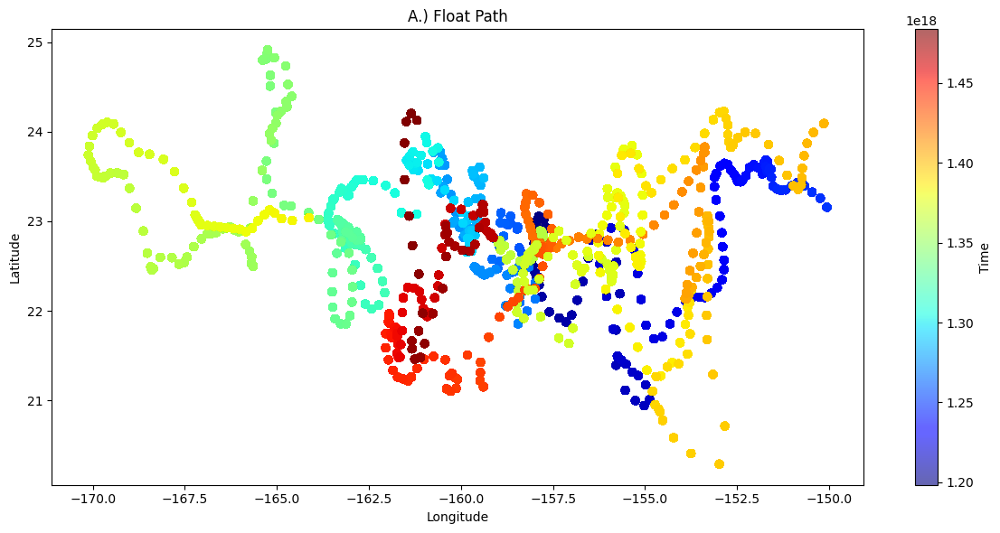

In [147]:
# 繪製圖表
fig, axes = plt.subplots(figsize=(12, 6))

# 獨立繪製A.)浮標路徑圖
sc = axes.scatter(profile_data['LONGITUDE'], profile_data['LATITUDE'], c=profile_data[time_var], cmap='jet', marker='o', alpha=0.6)
axes.set_title('A.) Float Path')
axes.set_ylabel('Latitude')
axes.set_xlabel('Longitude')
fig.colorbar(sc, ax=axes, orientation='vertical', label='Time')

plt.tight_layout()
plt.show()

In [149]:
# 確認TIME變量
time_var = 'TIME'

# 創建深度和時間範圍
# pres_bins = np.arange(0, 350, 10)
# time_bins = pd.date_range(start=profile_data[time_var].min().values, end=profile_data[time_var].max().values, freq='MS')
# print(pres_bins)
# print(time_bins)
# 獨立設置時間範圍
# time_range = pd.date_range(start='2005-01-01', end=profile_data[time_var].max().values, freq='MS')


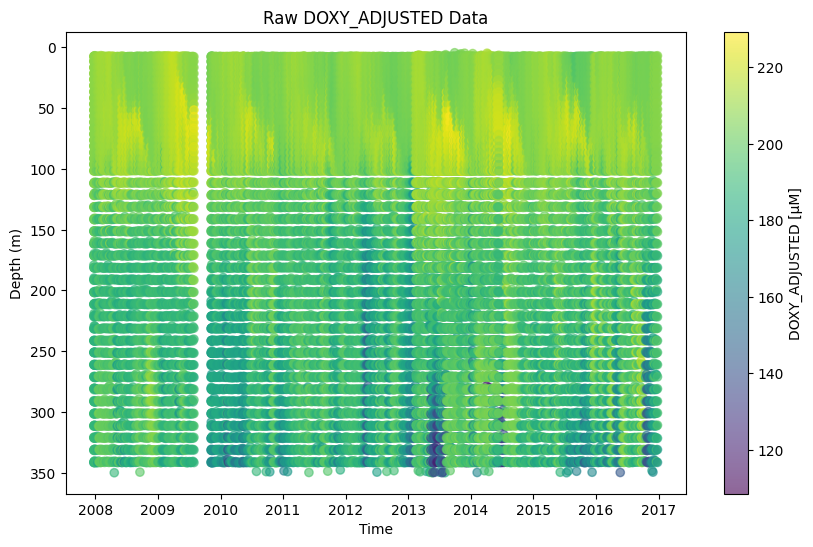

In [150]:
# Convert xarray Dataset to DataFrame and drop NaNs in specified columns
df = profile_data[['DOXY_ADJUSTED', 'PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'PRES', 'TIME']].to_dataframe().dropna()

# Print a subset of the data
# print(df[['DOXY_ADJUSTED', 'PRES', 'TIME']].describe())
# print(df[['DOXY_ADJUSTED', 'PRES', 'TIME']].head(10))

# Check PRES and TIME ranges
# print("PRES range:", df['PRES'].min(), df['PRES'].max())
# print("TIME range:", df['TIME'].min(), df['TIME'].max())

# Visualize raw data
plt.figure(figsize=(10, 6))
plt.scatter(df['TIME'], df['PRES'], c=df['DOXY_ADJUSTED'], cmap='viridis', alpha=0.6)
plt.gca().invert_yaxis()
plt.colorbar(label='DOXY_ADJUSTED [μM]')
plt.xlabel('Time')
plt.ylabel('Depth (m)')
plt.title('Raw DOXY_ADJUSTED Data')
plt.show()


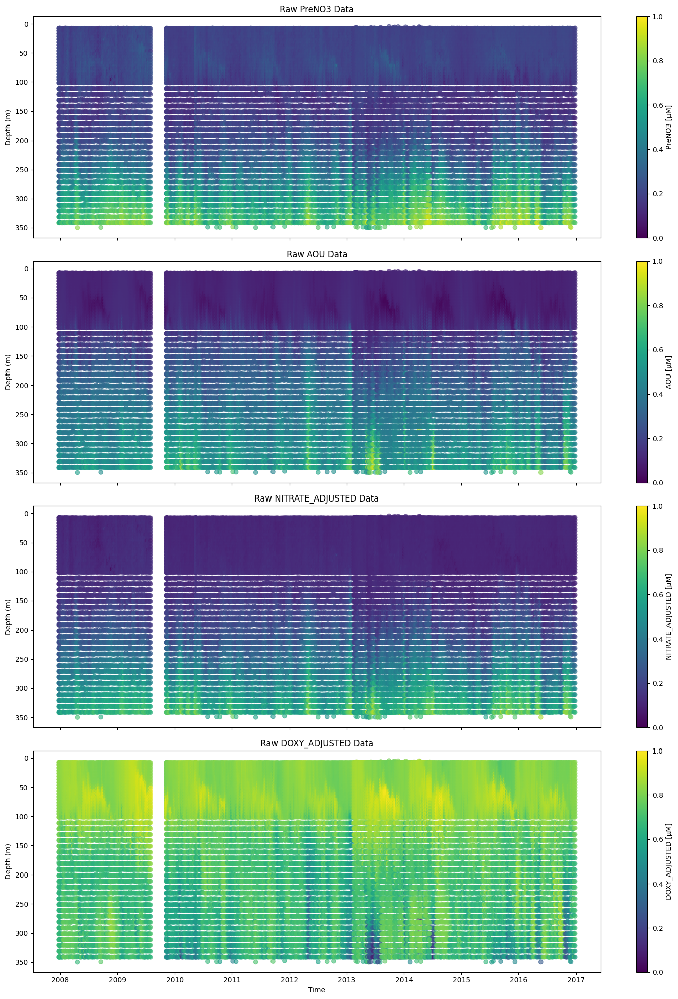

In [151]:
df = profile_data[['DOXY_ADJUSTED', 'PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'PRES', 'TIME']].to_dataframe().dropna()

# Define parameters for visualization
param_list = ['PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'DOXY_ADJUSTED']
titles = ['Raw PreNO3 Data', 'Raw AOU Data', 'Raw NITRATE_ADJUSTED Data', 'Raw DOXY_ADJUSTED Data']
cmaps = ['viridis', 'viridis', 'viridis', 'viridis']

# Plotting
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 20), sharex=True)

for i, param in enumerate(param_list):
    axes[i].scatter(df['TIME'], df['PRES'], c=df[param], cmap=cmaps[i], alpha=0.6)
    axes[i].invert_yaxis()
    axes[i].set_ylabel('Depth (m)')
    axes[i].set_title(titles[i])
    fig.colorbar(plt.cm.ScalarMappable(cmap=cmaps[i]), ax=axes[i], orientation='vertical', label=f'{param} [μM]')

axes[-1].set_xlabel('Time')

plt.tight_layout()
plt.show()

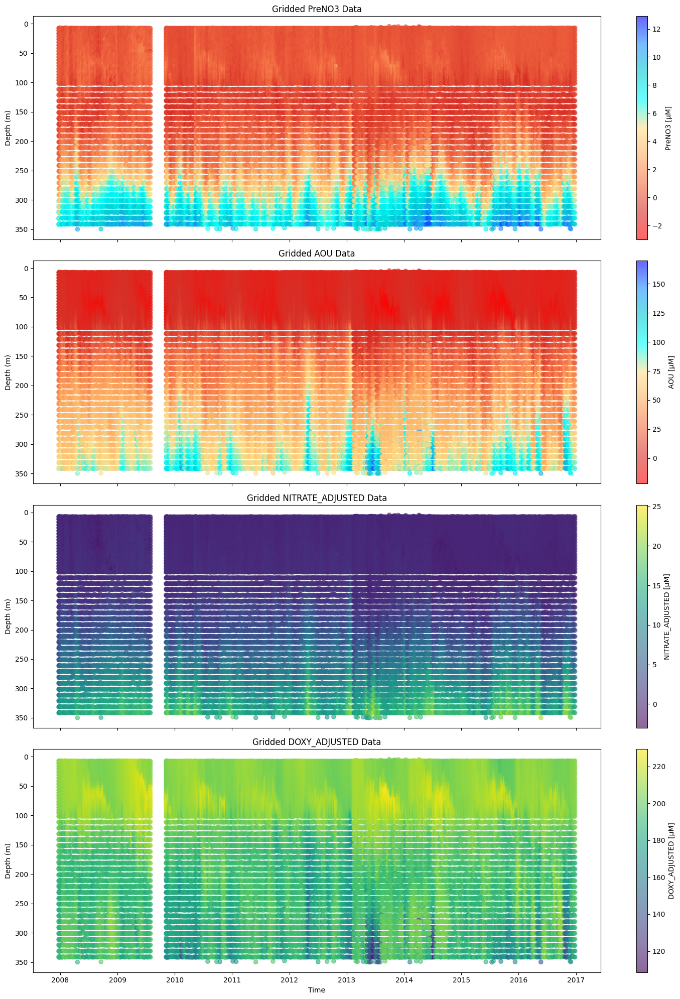

In [158]:
# Define the custom colormap
colors = ["#ff0000", "#d73027", "#f46d43", "#fdae61", "#fee08b", "#00FFFF", "#00CED1", "#1E90FF", "#0000FF"]
cmap = LinearSegmentedColormap.from_list('PreNO3_cmap', colors, N=256)

# Define the colormaps for each parameter
cmaps = {
    'PreNO3': cmap,
    'AOU': cmap,
    'NITRATE_ADJUSTED': 'viridis',
    'DOXY_ADJUSTED': 'viridis'
}

# Define parameters for visualization
param_list = ['PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'DOXY_ADJUSTED']
titles = ['Gridded PreNO3 Data', 'Gridded AOU Data', 'Gridded NITRATE_ADJUSTED Data', 'Gridded DOXY_ADJUSTED Data']

# Ensure the data is cleaned and NaNs are handled
df_cleaned = profile_data[['DOXY_ADJUSTED', 'PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'PRES', 'TIME']].to_dataframe().dropna()

# Plotting the gridded data for vertical profiles
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 20), sharex=True)

for i, param in enumerate(param_list):
    scatter = axes[i].scatter(df_cleaned['TIME'], df_cleaned['PRES'], c=df_cleaned[param], cmap=cmaps[param], alpha=0.6)
    axes[i].invert_yaxis()
    axes[i].set_ylabel('Depth (m)')
    axes[i].set_title(titles[i])
    fig.colorbar(scatter, ax=axes[i], orientation='vertical', label=f'{param} [μM]')

axes[-1].set_xlabel('Time')

plt.tight_layout()
plt.show()

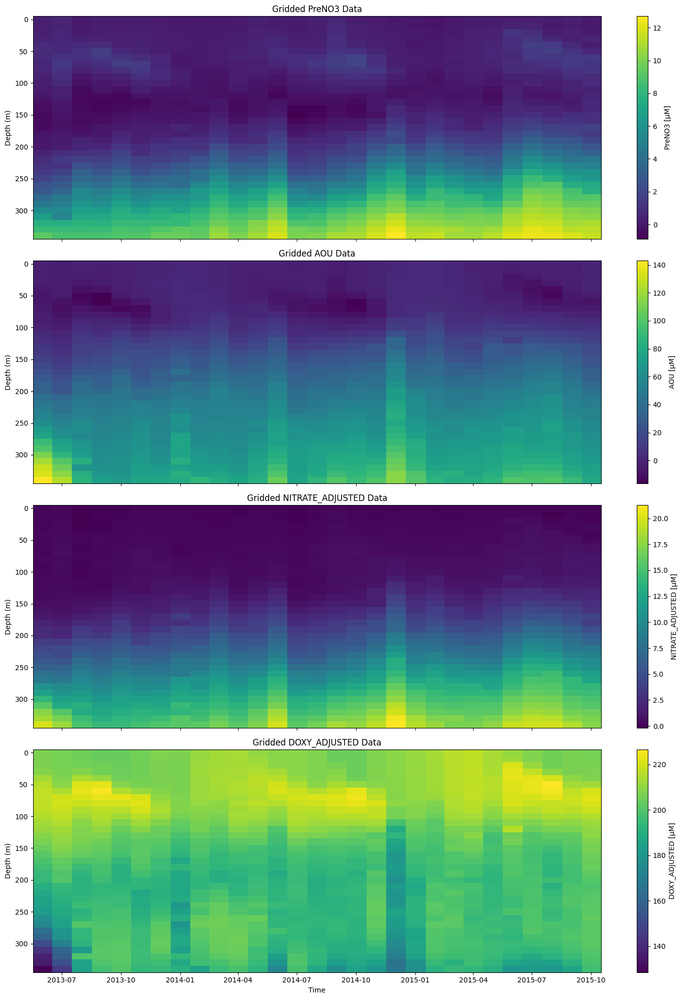

In [109]:
def grid_data(df, param, pres_bins, time_bins):
    # Initialize an empty grid with NaNs
    grid = np.full((len(pres_bins) - 1, len(time_bins) - 1), np.nan)
    
    # Bin the data
    df['PRES_bin'] = pd.cut(df['PRES'], bins=pres_bins, labels=False)
    df['TIME_bin'] = pd.cut(df['TIME'], bins=time_bins, labels=False)
    
    # Iterate over the bins to fill the grid
    for i in range(len(pres_bins) - 1):
        for j in range(len(time_bins) - 1):
            # Get the data points that fall into the current bin
            bin_data = df[(df['PRES_bin'] == i) & (df['TIME_bin'] == j)]
            if not bin_data.empty:
                # Compute the mean value for the current bin
                grid[i, j] = bin_data[param].mean()
    
    return grid

# Convert xarray Dataset to DataFrame and drop NaNs in specified columns
df = profile_data[['DOXY_ADJUSTED', 'PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'PRES', 'TIME']].to_dataframe().dropna()

if all_data:
    time_min = '2008-01-01'
else:
    time_min = '2013-01-01'   

# Define the bins
pres_bins = np.arange(0, 360, 10)  # Depth bins
time_bins = pd.date_range(start=df['TIME'].min(), end=df['TIME'].max(), freq='MS')  # Time bins

# Define parameters for visualization
param_list = ['PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'DOXY_ADJUSTED']
titles = ['Gridded PreNO3 Data', 'Gridded AOU Data', 'Gridded NITRATE_ADJUSTED Data', 'Gridded DOXY_ADJUSTED Data']
cmaps = ['viridis', 'viridis', 'viridis', 'viridis']

# Plotting
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 20), sharex=True)

for i, param in enumerate(param_list):
    grid = grid_data(df, param, pres_bins, time_bins)
    pc = axes[i].pcolormesh(time_bins[:-1], pres_bins[:-1], grid, cmap=cmaps[i], shading='auto')
    axes[i].invert_yaxis()
    axes[i].set_ylabel('Depth (m)')
    axes[i].set_title(titles[i])
    fig.colorbar(pc, ax=axes[i], orientation='vertical', label=f'{param} [μM]')

axes[-1].set_xlabel('Time')

plt.tight_layout()
plt.show()


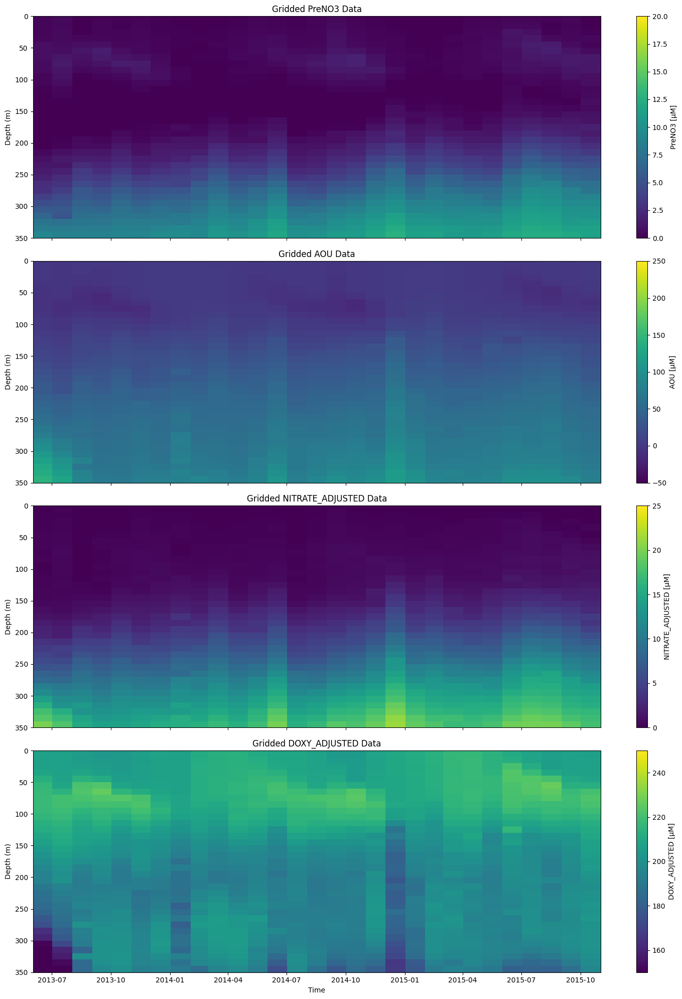

In [112]:
def grid_data(df, param, pres_bins, time_bins):
    # Initialize an empty grid with NaNs
    grid = np.full((len(pres_bins) - 1, len(time_bins) - 1), np.nan)
    
    # Bin the data
    df['PRES_bin'] = pd.cut(df['PRES'], bins=pres_bins, labels=False)
    df['TIME_bin'] = pd.cut(df['TIME'], bins=time_bins, labels=False)
    
    # Iterate over the bins to fill the grid
    for i in range(len(pres_bins) - 1):
        for j in range(len(time_bins) - 1):
            # Get the data points that fall into the current bin
            bin_data = df[(df['PRES_bin'] == i) & (df['TIME_bin'] == j)]
            if not bin_data.empty:
                # Compute the mean value for the current bin
                grid[i, j] = bin_data[param].mean()
    
    return grid

# Define the bin ranges for the parameters
param_bins = {
    'PreNO3': [0, 20],
    'AOU': [-50, 250],
    'NITRATE_ADJUSTED': [0, 25],
    'DOXY_ADJUSTED': [150, 250]
}

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 20), sharex=True)

# Binning parameters
pres_bins = np.arange(0, 351, 10)
time_range = pd.date_range(start=df['TIME'].min(), end=df['TIME'].max(), freq='MS')

# Plotting parameters
param_list = ['PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'DOXY_ADJUSTED']
titles = ['Gridded PreNO3 Data', 'Gridded AOU Data', 'Gridded NITRATE_ADJUSTED Data', 'Gridded DOXY_ADJUSTED Data']
cmaps = ['viridis', 'viridis', 'viridis', 'viridis']

for i, param in enumerate(param_list):
    grid = grid_data(df, param, pres_bins, time_range)
    vmin, vmax = param_bins[param]
    cs = axes[i].pcolormesh(time_range, pres_bins, grid, cmap=cmaps[i], shading='auto', vmin=vmin, vmax=vmax)
    fig.colorbar(cs, ax=axes[i], orientation='vertical', label=f'{param} [μM]')
    axes[i].set_title(titles[i])
    axes[i].set_ylabel('Depth (m)')
    axes[i].invert_yaxis()

axes[-1].set_xlabel('Time')

plt.tight_layout()
plt.show()


In [152]:
# Check basic statistics of the data used for the horizontal map plot
print("Horizontal Map Data (filtered_data):")
print(filtered_data[['PreNO3', 'LONGITUDE', 'LATITUDE']].to_dataframe().describe())
print(filtered_data[['PreNO3', 'LONGITUDE', 'LATITUDE']].to_dataframe().head())

df1 = debug_data[['DOXY_ADJUSTED', 'PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'PRES', 'TIME']].to_dataframe().dropna()
# Check basic statistics of the data used for the vertical profile plot
print("\nVertical Profile Data (df):")
print(df1[['PreNO3', 'LONGITUDE', 'LATITUDE']].describe())
print(df1[['PreNO3', 'LONGITUDE', 'LATITUDE']].head())


Horizontal Map Data (filtered_data):
             PreNO3      LONGITUDE       LATITUDE  \
count  33664.000000  153445.000000  153445.000000   
mean       0.823462    -113.398634      29.045928   
min       -3.160023    -170.120000      20.289000   
25%        0.066173    -157.941000      22.926000   
50%        0.437066    -147.840000      25.241000   
75%        1.001862     -64.790000      34.532000   
max       10.815565     -35.031000      49.521000   
std        1.556507      48.828932       7.195990   

                                TIME  
count                         153445  
mean   2012-10-03 19:57:25.025516800  
min    2007-12-23 10:58:55.999000064  
25%    2011-03-19 22:54:57.002000128  
50%              2012-12-03 01:23:33  
75%    2014-04-27 06:20:43.002000128  
max    2017-01-04 14:57:41.002000128  
std                              NaN  
            PreNO3  LONGITUDE  LATITUDE                          TIME
N_POINTS                                                        

In [153]:
# Define the variables of interest
variables_of_interest = ['DOXY_ADJUSTED', 'PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'PRES', 'TIME']

# Drop rows where any of the variables of interest are NaN
df_cleaned = debug_data[variables_of_interest].to_dataframe().dropna()

# Verify the cleaned data
print("Cleaned Data:")
print(df_cleaned.describe())
print(df_cleaned.head())

Cleaned Data:
       DOXY_ADJUSTED        PreNO3           AOU  NITRATE_ADJUSTED  \
count   15564.000000  15564.000000  15564.000000      15564.000000   
mean      208.847244      0.211068      1.983411          0.359415   
min       169.532547     -2.984354    -21.878281         -3.031810   
25%       205.422546     -0.076271     -3.523647          0.036014   
50%       209.191513      0.237181      0.125175          0.267516   
75%       212.811676      0.508116      4.414642          0.568665   
max       229.323486      3.687294     65.185715          6.422348   
std         6.741116      0.539458      9.645696          0.532456   

               PRES                           TIME      LATITUDE     LONGITUDE  
count  15564.000000                          15564  15564.000000  15564.000000  
mean      76.574371  2012-09-09 16:46:35.048846592     22.780078   -158.913760  
min       25.100000  2007-12-23 10:58:55.999000064     20.289000   -170.120000  
25%       50.475000     2010-10

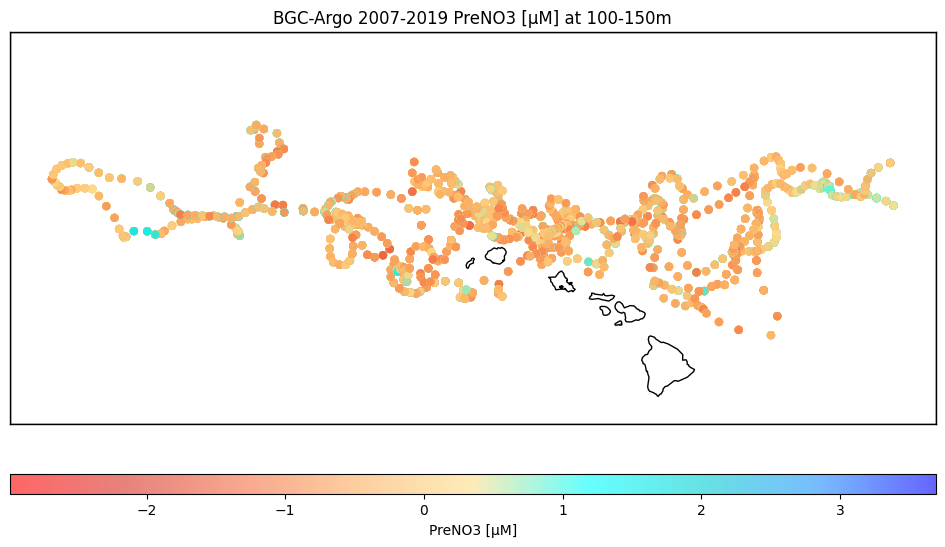

In [154]:
# Extract necessary columns and drop NaN values for the map plot
filtered_data_map = df_cleaned.dropna(subset=['PreNO3', 'LONGITUDE', 'LATITUDE'])

# Extract lon, lat, and PreNO3 values
lon_map = filtered_data_map['LONGITUDE'].values
lat_map = filtered_data_map['LATITUDE'].values
preno3_map = filtered_data_map['PreNO3'].values

# Plotting
fig, ax = plt.subplots(figsize=(12, 6))
m = Basemap(projection='merc', llcrnrlat=lat_map.min()-2.0, urcrnrlat=lat_map.max()+2.0, llcrnrlon=lon_map.min()-1.0, urcrnrlon=lon_map.max()+1.0, resolution='i', ax=ax)

m.drawcoastlines()
m.drawcountries()
m.drawmapboundary()

x_map, y_map = m(lon_map, lat_map)
sc_map = m.scatter(x_map, y_map, c=preno3_map, cmap=cmap, marker='o', edgecolor='none', alpha=0.6)
cb_map = m.colorbar(sc_map, location='bottom', pad=0.5)
cb_map.set_label('PreNO3 [µM]')

plt.title('BGC-Argo 2007-2019 PreNO3 [µM] at 100-150m')
plt.show()

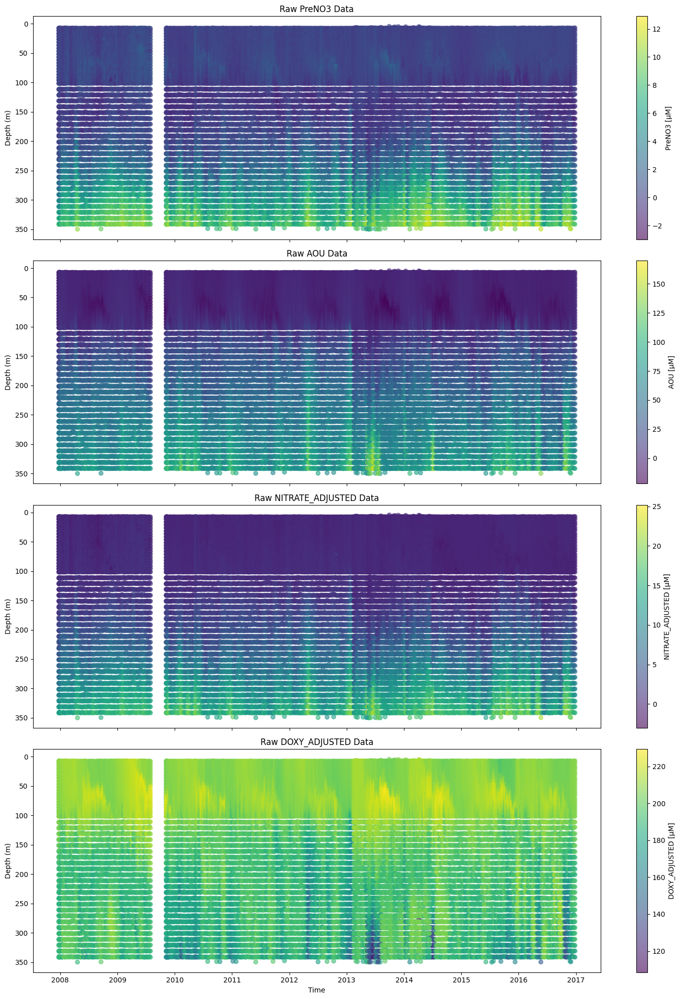

In [135]:
# Define parameters for visualization
param_list = ['PreNO3', 'AOU', 'NITRATE_ADJUSTED', 'DOXY_ADJUSTED']
titles = ['Raw PreNO3 Data', 'Raw AOU Data', 'Raw NITRATE_ADJUSTED Data', 'Raw DOXY_ADJUSTED Data']
cmaps = ['viridis', 'viridis', 'viridis', 'viridis']

# Plotting the raw data for vertical profiles
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 20), sharex=True)

for i, param in enumerate(param_list):
    scatter = axes[i].scatter(df_cleaned['TIME'], df_cleaned['PRES'], c=df_cleaned[param], cmap=cmaps[i], alpha=0.6)
    axes[i].invert_yaxis()
    axes[i].set_ylabel('Depth (m)')
    axes[i].set_title(titles[i])
    fig.colorbar(scatter, ax=axes[i], orientation='vertical', label=f'{param} [μM]')

axes[-1].set_xlabel('Time')

plt.tight_layout()
plt.show()

Total points in 'DOXY_ADJUSTED': 169516
Number of NaNs in 'DOXY_ADJUSTED': 135223
count    34293.000000
mean       199.834793
std         13.411557
min        108.546799
25%        191.729202
50%        203.219742
75%        209.505127
max        229.323486
Name: DOXY_ADJUSTED, dtype: float64


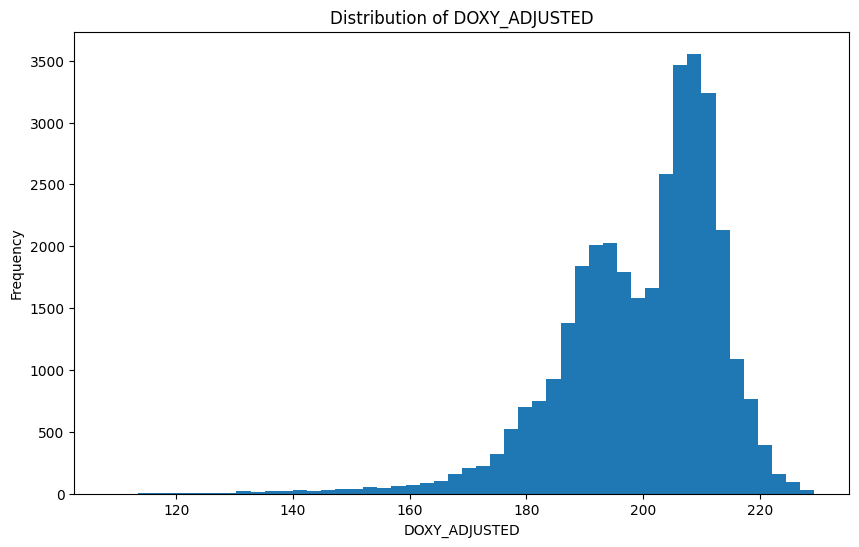

In [ ]:
# Debug
# Checking the NaN counts and statistics
print("Total points in 'DOXY_ADJUSTED':", profile_data["DOXY_ADJUSTED"].size)
print("Number of NaNs in 'DOXY_ADJUSTED':", np.isnan(profile_data["DOXY_ADJUSTED"]).sum().values)
print(profile_data["DOXY_ADJUSTED"].to_series().describe())

# Plotting histogram of 'DOXY_ADJUSTED' to visualize its distribution
plt.figure(figsize=(10, 6))
profile_data["DOXY_ADJUSTED"].to_series().plot.hist(bins=50)
plt.title("Distribution of DOXY_ADJUSTED")
plt.xlabel("DOXY_ADJUSTED")
plt.ylabel("Frequency")
plt.show()


In [ ]:
print(profile_data[['DOXY_ADJUSTED', 'PRES', 'TIME']].to_dataframe().head())


                                    DOXY_ADJUSTED  PRES  \
TIME                          PRES                        
2007-12-23 10:58:55.999000064 4.3             NaN   4.3   
                              6.0             NaN   6.0   
                              7.3      209.593445   7.3   
                              8.0             NaN   8.0   
                              10.0            NaN  10.0   

                                                            TIME  LATITUDE  \
TIME                          PRES                                           
2007-12-23 10:58:55.999000064 4.3  2007-12-23 10:58:55.999000064    22.866   
                              6.0  2007-12-23 10:58:55.999000064    22.866   
                              7.3  2007-12-23 10:58:55.999000064    22.866   
                              8.0  2007-12-23 10:58:55.999000064    22.866   
                              10.0 2007-12-23 10:58:55.999000064    22.866   

                                    LON

In [3]:
# Code from argopy official example https://nbviewer.org/github/euroargodev/argopy/blob/master/docs/examples/BGC_scatter_map_data_mode.ipynb
# Load an index of BGC profiles:
# idx = ArgoIndex(index_file='bgc-s').load()  # 'bgc-s' is a shortcut for 'argo_synthetic-profile_index.txt'
idx = ArgoIndex(index_file='bgc-b').load()  # 'bgc-b' is a shortcut for 'argo_bio-profile_index.txt'
idx

<argoindex.pyarrow>
Host: https://data-argo.ifremer.fr
Index: argo_bio-profile_index.txt
Convention: argo_bio-profile_index (Bio-Profile directory file of the Argo GDAC)
Loaded: True (313624 records)
Searched: False

In [4]:
# Define a parameter to work with:
# param = 'BBP470'
param = 'DOXY'


In [5]:
# Get more verbose information about this parameter (usefull for plot titles):
reftbl = ArgoNVSReferenceTables().tbl('R03')
param_info = reftbl[reftbl['altLabel']==param].iloc[0]
param_info

altLabel                                                   DOXY
prefLabel                        Dissolved oxygen concentration
definition            Dissolved oxygen concentration (umol/kg).
deprecated                                                false
id            http://vocab.nerc.ac.uk/collection/R03/current...
Name: 26, dtype: object

In [6]:
# Search for this parameter profiles:
idx.search_params(param)
idx

<argoindex.pyarrow>
Host: https://data-argo.ifremer.fr
Index: argo_bio-profile_index.txt
Convention: argo_bio-profile_index (Bio-Profile directory file of the Argo GDAC)
Loaded: True (313624 records)
Searched: True (300167 matches, 95.7092%)

In [7]:
# Export search results to a dataframe:
df = idx.to_dataframe()
df.sample(5)

,file,date,latitude,longitude,ocean,profiler_code,institution_code,parameters,parameter_data_mode,date_update,wmo,cyc,institution,profiler
84530,aoml/5905983/profiles/BD5905983_080.nc,2020-12-25 02:07:00,-36.587,-35.812,A,846,AO,PRES TEMP_DOXY TPHASE_DOXY DOXY FLUORESCENCE_C...,RRRDRARARRRRRDRRD,2023-04-22 19:29:16,5905983,80,"AOML, USA",Teledyne Webb Research float with SBE conducti...
146140,coriolis/6900791/profiles/BR6900791_077.nc,2023-02-06 08:27:00,-53.934,31.680,I,844,IF,PRES C1PHASE_DOXY C2PHASE_DOXY TEMP_DOXY DOXY,RRRRA,2023-02-06 10:27:36,6900791,77,"Ifremer, France",ARVOR float with SBE conductivity sensor
114287,bodc/6901183/profiles/BD6901183_240.nc,2019-01-19 15:39:00,25.237,-62.830,A,836,BO,PRES C1PHASE_DOXY C2PHASE_DOXY TEMP_DOXY C1PHA...,RRRRRRRRRRDRRRRRRRRRRRRDDDDRRRARR,2023-02-14 12:41:19,6901183,240,"BODC, United Kingdom",PROVOR III
86927,aoml/5906002/profiles/BD5906002_122.nc,2022-04-22 14:23:27,-58.999,114.150,I,846,AO,PRES TEMP_DOXY TPHASE_DOXY DOXY FLUORESCENCE_C...,RRRDRARARRRRRDRRD,2024-01-02 12:22:57,5906002,122,"AOML, USA",Teledyne Webb Research float with SBE conducti...
143478,coriolis/6900499/profiles/BR6900499_048.nc,2007-05-17 22:22:01,69.162,5.271,A,846,IF,PRES MOLAR_DOXY DOXY,RRR,2020-01-17 09:33:24,6900499,48,"Ifremer, France",Teledyne Webb Research float with SBE conducti...


In [8]:
# To make the scatter map, we need to have the data mode available in one DataFrame column
# so we need to add a new column with the DATA_MODE of the PARAMETER:
df["variables"] = df["parameters"].apply(lambda x: x.split())
df["%s_DM" % param] = df.apply(lambda x: x['parameter_data_mode'][x['variables'].index(param)] if param in x['variables'] else '', axis=1)

In [9]:
print(df)

                                           file                date  latitude  \
0        aoml/1900722/profiles/BD1900722_001.nc 2006-10-22 02:16:24   -40.316   
1        aoml/1900722/profiles/BD1900722_002.nc 2006-11-01 06:44:23   -40.390   
2        aoml/1900722/profiles/BD1900722_003.nc 2006-11-11 10:12:22   -40.455   
3        aoml/1900722/profiles/BD1900722_004.nc 2006-11-21 07:50:21   -40.134   
4        aoml/1900722/profiles/BD1900722_005.nc 2006-12-01 18:33:00   -39.641   
...                                         ...                 ...       ...   
300162  meds/4902686/profiles/BR4902686_002D.nc 2024-05-14 16:34:00       NaN   
300163   meds/4902686/profiles/BR4902686_003.nc 2024-05-16 15:40:00    56.317   
300164  meds/4902686/profiles/BR4902686_003D.nc 2024-05-15 16:19:00       NaN   
300165   meds/4902686/profiles/BR4902686_004.nc 2024-05-17 15:40:00    56.391   
300166  meds/4902686/profiles/BR4902686_004D.nc 2024-05-16 16:15:00       NaN   

        longitude ocean  pr

/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


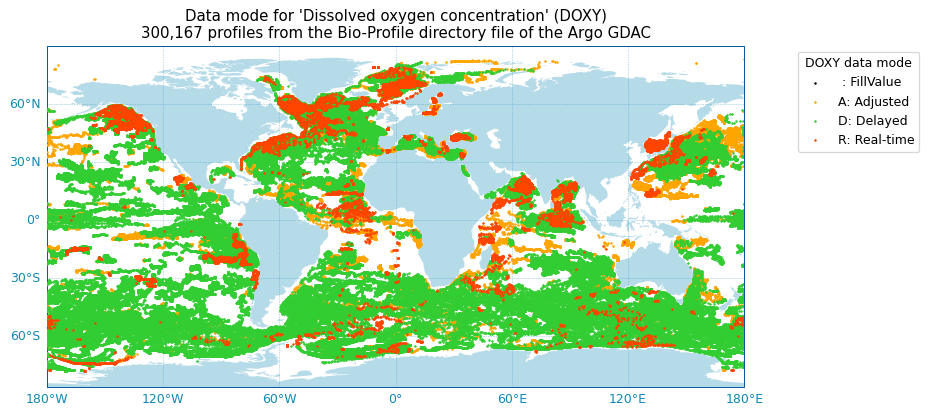

In [11]:
# Finally plot the map:
fig, ax = scatter_map(df,
                        hue="%s_DM" % param,
                        cmap="data_mode",
                        figsize=(10,6),
                        markersize=2,
                        markeredgecolor=None,
                        traj=False,  # Because some floats do weird things around 180/-180
                        set_global=False,
                        legend_title='%s data mode' % param)
ax.set_title("Data mode for '%s' (%s)\n%s profiles from the %s" % (param_info['prefLabel'], 
                                                                   param, 
                                                                   "{:,}".format(idx.N_MATCH), 
                                                                   idx.convention_title)
            );

In [13]:
#Another official example: https://nbviewer.org/github/euroargodev/argopy/blob/master/docs/examples/BGC_region_float_data.ipynb
import logging
logging.getLogger("matplotlib").setLevel(logging.ERROR)
logging.getLogger("pyproj").setLevel(logging.ERROR)
logging.getLogger("fsspec").setLevel(logging.ERROR)
logging.getLogger("parso").setLevel(logging.ERROR)
logging.getLogger("asyncio").setLevel(logging.ERROR)
DEBUGFORMATTER = '%(asctime)s [%(levelname)s] [%(name)s] %(filename)s:%(lineno)d: %(message)s'
logging.basicConfig(
    level=logging.DEBUG,
    format=DEBUGFORMATTER,
    datefmt='%I:%M:%S %p',
    handlers=[logging.FileHandler("nb-docs.log", mode='w')]
)

In [14]:
#we'll work with BGC floats in the Labrador Sea
# Format: [lon_min, lon_max, lat_min, lat_max, pres_min, pres_max, datim_min, datim_max]
# BOX = [-56, -45, 54, 60, 0, 2000, '2022-01', '2023-01']
BOX = [-56, -45, 54, 60, 0, 500, '2019-01', '2023-01']
# Load the BGC-synthetic profiles index
# rq: we work with synthetic profiles because that's the only dataset available from the erddap at this point (2023/07/21)
idx = ArgoIndex(index_file='bgc-s').load()  
idx

<argoindex.pyarrow>
Host: https://data-argo.ifremer.fr
Index: argo_synthetic-profile_index.txt
Convention: argo_synthetic-profile_index (Synthetic-Profile directory file of the Argo GDAC)
Loaded: True (312317 records)
Searched: False

In [15]:
# Select profile in a space/time domain:
index_BOX = [BOX[ii] for ii in [0, 1, 2, 3, 6, 7]]  # We don't want the pressure axis BOX limits
idx.search_lat_lon_tim(index_BOX)

<argoindex.pyarrow>
Host: https://data-argo.ifremer.fr
Index: argo_synthetic-profile_index.txt
Convention: argo_synthetic-profile_index (Synthetic-Profile directory file of the Argo GDAC)
Loaded: True (312317 records)
Searched: True (1464 matches, 0.4688%)

In [16]:
# Get the list of all parameters for this region:
idx.read_params()

['BBP700',
 'CDOM',
 'CHLA',
 'CHLA_FLUORESCENCE',
 'CP660',
 'DOWNWELLING_PAR',
 'DOWN_IRRADIANCE380',
 'DOWN_IRRADIANCE412',
 'DOWN_IRRADIANCE490',
 'DOXY',
 'NITRATE',
 'PH_IN_SITU_TOTAL',
 'PRES',
 'PSAL',
 'TEMP']

In [17]:
# Extract the list of BGC parameters:
bgc_params = idx.read_params()
[bgc_params.remove(p) for p in ['PRES', 'TEMP', 'PSAL']]  # Remove core variables from the list
bgc_params

['BBP700',
 'CDOM',
 'CHLA',
 'CHLA_FLUORESCENCE',
 'CP660',
 'DOWNWELLING_PAR',
 'DOWN_IRRADIANCE380',
 'DOWN_IRRADIANCE412',
 'DOWN_IRRADIANCE490',
 'DOXY',
 'NITRATE',
 'PH_IN_SITU_TOTAL']

In [18]:
# How many different floats in the region:
len(idx.read_wmo())

51

In [20]:
%%time
# f = DataFetcher(ds='bgc', mode='expert', params='all', parallel=True, progress=True).region(BOX).load()  # Fetch everything !
f = ArgoDataFetcher(ds='bgc', mode='expert', params='all',
                parallel=True, progress=True, cache=False,
                chunks_maxsize={'time': 30},
               )
f = f.region(BOX).load()
f

Final post-processing of the merged dataset () ...


/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self._dims = list(xarray_obj.dims.keys())


CPU times: user 56 s, sys: 573 ms, total: 56.6 s
Wall time: 5min 12s


<datafetcher.erddap>
Name: Ifremer erddap Argo BGC data fetcher for a space/time region
API: https://erddap.ifremer.fr/erddap
Domain: [x=-56.00/-45.00; y=54.00/60.0 ... 00.0; t=2019-01-01/2023-01-01]
BGC variables: ['BBP700', 'CDOM', 'CHLA', 'CP660', 'DOWNWELLING_PAR', 'DOWN_IRRADIANCE380', 'DOWN_IRRADIANCE412', 'DOWN_IRRADIANCE490', 'DOXY', 'NITRATE', 'PH_IN_SITU_TOTAL', 'PRES', 'PSAL', 'TEMP']
BGC 'must be measured' variables: []
Performances: cache=False, parallel=True
User mode: expert
Dataset: bgc

In [21]:
# Check the data structure (xarray.dataset):
ds = f.data
ds

<xarray.Dataset> Size: 272MB
Dimensions:                            (N_POINTS: 519168)
Coordinates:
    LATITUDE                           (N_POINTS) float64 4MB 56.93 ... 59.3
    LONGITUDE                          (N_POINTS) float64 4MB -52.52 ... -54.86
    TIME                               (N_POINTS) datetime64[ns] 4MB 2019-01-...
  * N_POINTS                           (N_POINTS) int64 4MB 0 1 ... 25150 25151
Data variables: (12/90)
    BBP700                             (N_POINTS) float32 2MB nan nan ... nan
    BBP700_ADJUSTED                    (N_POINTS) float32 2MB nan nan ... nan
    BBP700_ADJUSTED_ERROR              (N_POINTS) float32 2MB nan nan ... nan
    BBP700_ADJUSTED_QC                 (N_POINTS) int64 4MB 99999 99999 ... 0 0
    BBP700_DATA_MODE                   (N_POINTS) <U1 2MB 'A' 'A' 'A' ... '' ''
    BBP700_QC                          (N_POINTS) int64 4MB 99999 99999 ... 0 0
    ...                                 ...
    TEMP_ADJUSTED                      (N_POINTS) float32 2MB 3.108 3.11 ... nan
    TEMP_ADJUSTED_ERROR                (N_POINTS) float32 2MB 0.002 ... nan
    TEMP_ADJUSTED_QC                   (N_POINTS) int64 4MB 1 1 1 1 ... 0 0 0 0
    TEMP_DATA_MODE                     (N_POINTS) <U1 2MB 'D' 'D' 'D' ... '' ''
    TEMP_QC                            (N_POINTS) int64 4MB 1 1 1 1 ... 1 1 1 1
    TIME_QC                            (N_POINTS) int64 4MB 1 1 1 1 ... 1 1 1 1
Attributes:
    DATA_ID:              ARGO-BGC
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://erddap.ifremer.fr/erddap
    Fetched_by:           bioer
    Fetched_date:         2024/05/21
    Fetched_constraints:  [x=-56.00/-45.00; y=54.00/60.00; z=0.0/500.0; t=201...
    Fetched_uri:          ['https://erddap.ifremer.fr/erddap/tabledap/ArgoFlo...

In [22]:
print(ds.argo)
df = f.index
print(df)

<xarray.Dataset.argo>
This is a collection of Argo points
N_POINTS(37671) ~ N_PROF(1148) x N_LEVELS(1420)
                                             file                date  \
0          aoml/4903365/profiles/SD4903365_010.nc 2021-11-11 04:59:42   
1          aoml/4903365/profiles/SD4903365_011.nc 2021-11-21 03:43:40   
2      coriolis/1902578/profiles/SR1902578_001.nc 2022-05-30 05:01:26   
3     coriolis/1902578/profiles/SR1902578_001D.nc 2022-05-29 12:11:57   
4      coriolis/1902578/profiles/SR1902578_002.nc 2022-05-31 14:23:37   
...                                           ...                 ...   
1459       meds/4902580/profiles/SR4902580_020.nc 2022-11-26 05:13:00   
1460       meds/4902580/profiles/SR4902580_021.nc 2022-12-06 10:14:00   
1461       meds/4902580/profiles/SR4902580_022.nc 2022-12-16 15:15:00   
1462       meds/4902580/profiles/SR4902580_023.nc 2022-12-26 20:09:00   
1463       meds/4902581/profiles/SR4902581_001.nc 2022-05-21 06:14:00   

      latitude  l

(<Figure size 900x540 with 1 Axes>,
 <GeoAxes: xlabel='longitude', ylabel='latitude'>)

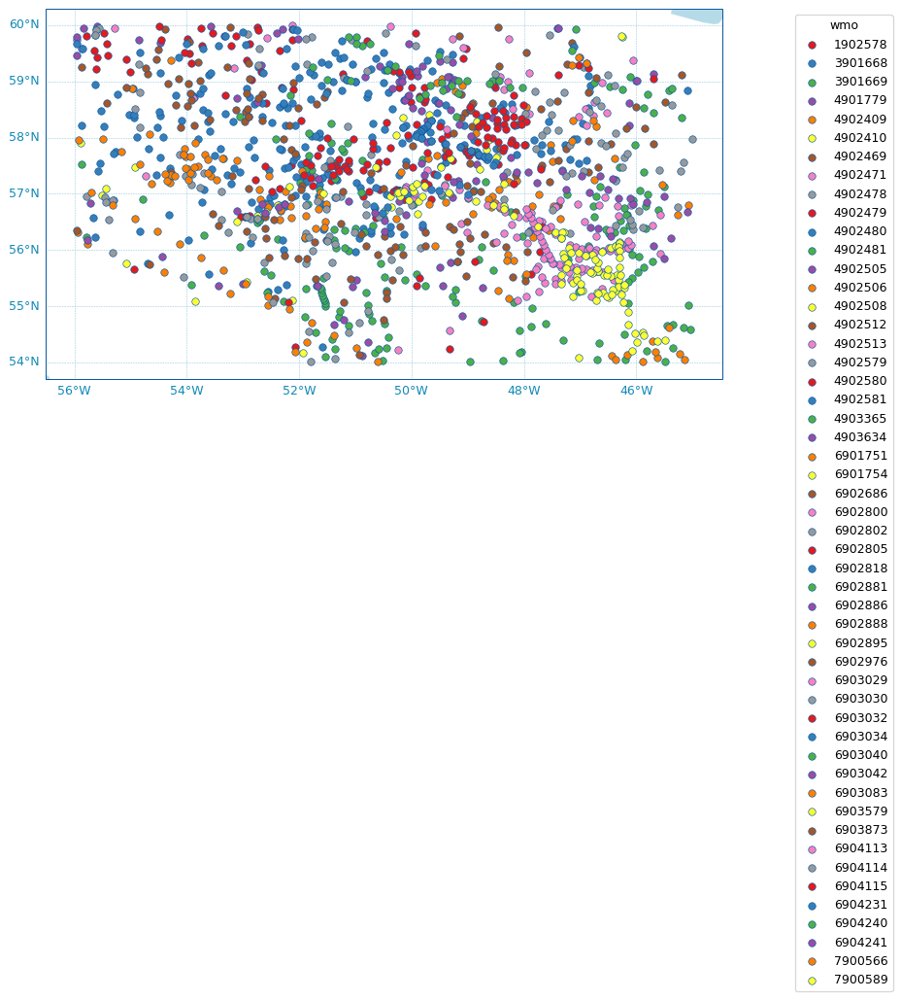

In [24]:
# But here, we use the index retrieved with the DataFetcher:
scatter_map(df, traj=False, set_global=False, legend=True)

In [25]:
# Randomly select one BGC parameter to work with:
# a_param = bgc_params[np.random.randint(len(bgc_params))]
a_param = 'DOXY' #CHLA
# Get more verbose information about this parameter (usefull for plot titles):
reftbl = ArgoNVSReferenceTables().tbl('R03')
param_info = reftbl[reftbl['altLabel']==a_param].iloc[0].to_dict()
param_info

{'altLabel': 'DOXY',
 'prefLabel': 'Dissolved oxygen concentration',
 'definition': 'Dissolved oxygen concentration (umol/kg).',
 'deprecated': 'false',
 'id': 'http://vocab.nerc.ac.uk/collection/R03/current/DOXY/'}

In [27]:
# Try to define readible color bounds for each BGC variables 
# (this is probably NOT appropriate for all regions and periods !)
c_bounds = {'BBP700': (20e-5, 70e-5),
            'CDOM': (0.4, 0.8),
            'CHLA': (0, 0.2),
            'DOWNWELLING_PAR': (0, 10),
            'DOWN_IRRADIANCE380': (0, .1),
            'DOWN_IRRADIANCE412': (0, .1),
            'DOWN_IRRADIANCE490': (0, .1),
            'DOXY': (250,300),
            'NITRATE': (-2, 20),
            'PH_IN_SITU_TOTAL': (6, 8.5),
           }

In [30]:
# We''l make use of the argopy color scheme:
ArgoColors('qc')

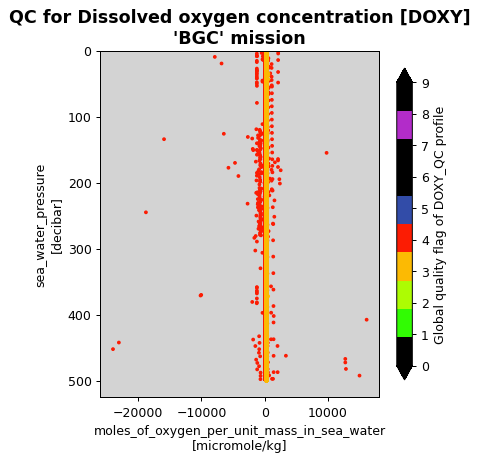

In [31]:
fig, ax = scatter_plot(ds, a_param + '_QC', this_x = a_param, 
                       vmin=0, vmax=9, cmap=ArgoColors('qc').cmap, figsize=(5,5))
ax.set_title("QC for %s [%s]\n'%s' mission" % (param_info['prefLabel'], a_param, f.mission), 
             fontdict={'weight': 'bold', 'size': 14});

Text(0.5, 1.0, "QC for Adjusted Dissolved oxygen concentration [DOXY_ADJUSTED]\n'BGC' mission")

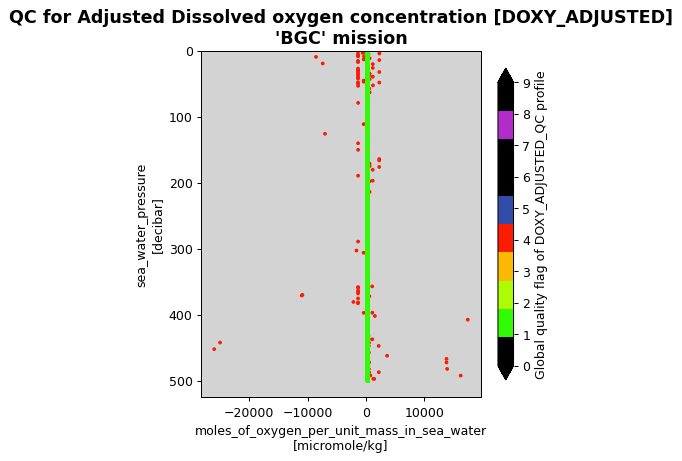

In [33]:
fig, ax = scatter_plot(ds, a_param + '_ADJUSTED_QC', this_x = a_param + '_ADJUSTED', 
                       vmin=0, vmax=9, cmap=ArgoColors('qc').cmap, figsize=(5,5))
ax.set_title("QC for Adjusted %s [%s]\n'%s' mission" % (param_info['prefLabel'], a_param + '_ADJUSTED', f.mission), 
             fontdict={'weight': 'bold', 'size': 14})

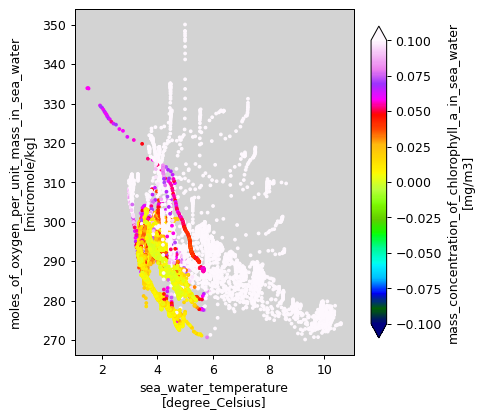

In [34]:
fig, ax = scatter_plot(ds, 'CHLA_ADJUSTED', this_x = 'TEMP_ADJUSTED', this_y = 'DOXY_ADJUSTED', figsize=(5,5))

Text(0.5, 1.0, "TEMP ('BGC' mission)")

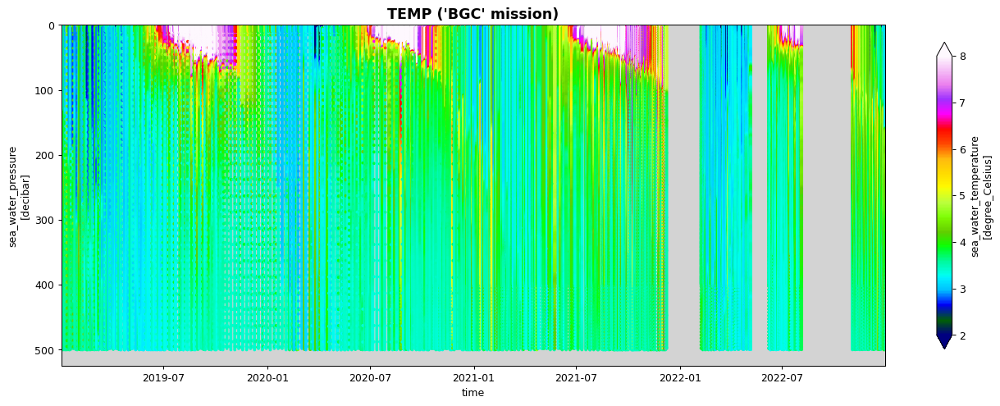

In [35]:
fig, ax = scatter_plot(ds, 'TEMP', vmin=2, vmax=8)
ax.set_title("%s ('%s' mission)" % ('TEMP', f.mission), fontdict={'weight': 'bold', 'size': 14})

In [44]:
%%time
WBOX = [-180, 180, -90, 90, 0, 2000, '2024-05-18', '2024-05-21']
g = ArgoDataFetcher(ds='bgc', mode='expert', params='all',
                parallel=True, progress=True, cache=False,
                chunks_maxsize={'time': 10},
               )
g = g.region(WBOX).load()
g

Final post-processing of the merged dataset () ...


/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self._dims = list(xarray_obj.dims.keys())


CPU times: user 1min 44s, sys: 1.48 s, total: 1min 46s
Wall time: 10min 3s


<datafetcher.erddap>
Name: Ifremer erddap Argo BGC data fetcher for a space/time region
API: https://erddap.ifremer.fr/erddap
Domain: [x=-180.00/180.00; y=-90.00/90 ... 00.0; t=2024-05-18/2024-05-21]
BGC variables: ['BBP470', 'BBP532', 'BBP700', 'CDOM', 'CHLA', 'CP660', 'DOWNWELLING_PAR', 'DOWN_IRRADIANCE380', 'DOWN_IRRADIANCE412', 'DOWN_IRRADIANCE443', 'DOWN_IRRADIANCE490', 'DOWN_IRRADIANCE555', 'DOXY', 'NITRATE', 'PH_IN_SITU_TOTAL', 'PRES', 'PSAL', 'TEMP']
BGC 'must be measured' variables: []
Performances: cache=False, parallel=True
User mode: expert
Dataset: bgc

In [45]:
ds1 = g.data
print(ds1.argo)
df1 = g.index
print(df1)

<xarray.Dataset.argo>
This is a collection of Argo points
N_POINTS(2175) ~ N_PROF(28) x N_LEVELS(1970)
                                       file                date  latitude  \
0    aoml/1902369/profiles/SR1902369_018.nc 2024-05-20 06:31:16    45.145   
1    aoml/1902371/profiles/SR1902371_023.nc 2024-05-20 06:29:40    51.932   
2    aoml/1902384/profiles/SR1902384_086.nc 2024-05-18 01:21:23    20.174   
3    aoml/1902454/profiles/SR1902454_036.nc 2024-05-18 10:00:04     4.768   
4    aoml/1902457/profiles/SR1902457_036.nc 2024-05-18 03:13:37     6.503   
..                                      ...                 ...       ...   
146  meds/4902612/profiles/SR4902612_068.nc 2024-05-19 12:02:00    55.942   
147  meds/4902614/profiles/SR4902614_036.nc 2024-05-18 12:53:00    51.014   
148  meds/4902620/profiles/SR4902620_059.nc 2024-05-18 18:40:00   -21.265   
149  meds/4902637/profiles/SR4902637_032.nc 2024-05-18 11:09:00    55.328   
150  meds/4902676/profiles/SR4902676_003.nc 2024-0

/home/bioer/.pyenv/versions/3.11.3/envs/py311/lib/python3.11/site-packages/argopy/xarray.py:70: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self._dims = list(xarray_obj.dims.keys())


(<Figure size 900x540 with 1 Axes>,
 <GeoAxes: xlabel='longitude', ylabel='latitude'>)

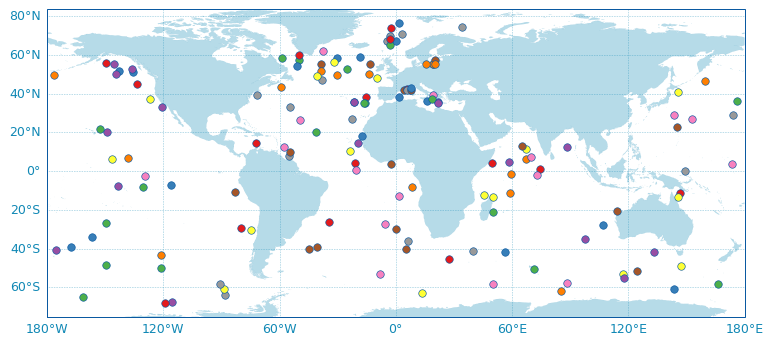

In [47]:
scatter_map(df1, traj=False, set_global=False, legend=False)